# ECE590: Smart Cameras Homework 4
## Nathan Inkawhich
**Duke University Spring 2019**

This notebook will handle the camera interfacing portion of HW4. Here we will use the DNN trained in the CNNTraining notebook.

In [1]:
import time
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import subprocess
import skimage
import skimage.io as imio
import skimage.transform as trans
from skimage.viewer import ImageViewer
#import glob
import re
from time import gmtime, strftime, sleep
import time
%matplotlib inline
mpl.rcParams['figure.figsize'] = (10.0, 6.0) 

/Users/nathaninkawhich/anaconda/envs/tensorflow_p36/lib/python3.6/site-packages/skimage/viewer/utils/core.py:10: UserWarning: Recommended matplotlib backend is `Agg` for full skimage.viewer functionality.
  warn("Recommended matplotlib backend is `Agg` for full "


**Test that we can talk to the camera**

In [2]:
subprocess.run("ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 'ls'", stdout=subprocess.PIPE, shell=True)

CompletedProcess(args="ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 'ls'", returncode=0, stdout=b'aqueti\nbin\ncuda-l4t\ncudnn\ndbGrab_30402_s01_00000.jpg\nDesktop\nDocuments\nDownloads\nexamples.desktop\ninkGrab_21602_s00_00000.jpg\njetson_clocks.sh\nMusic\nnv-gie-repo-ubuntu1604-ga-cuda8.0-trt2.1-20170614_1-1_arm64.deb\nOpenCV4Tegra\nPictures\nPublic\nreport_ip_to_host.sh\nsrc\ntegra_multimedia_api\ntegrastats\nTemplates\nVideos\n')

## Camera helper functions

These are the same helpers we have been using since homework 2.

In [3]:
# Take an image on the sensor and scp it to local machine
def grabImage(sid=0, imres=8):
    # I will use the file name inkGrab.... for the image grabbed from the camera. First step is to get rid of previously grabbed images
    subprocess.run('rm inkGrab*', stdout=subprocess.PIPE, shell=True)
    subprocess.run('ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "rm inkGrab*"', stdout=subprocess.PIPE, shell=True)
    # ok, now let's grab an image on the tegra
    cmD='ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "nvgstcapture-1.0 -m 1 --sensor-id '+str(sid)+' -A --capture-auto 1 --file-name inkGrab --image-res '+ str(imres)+'"'
    subprocess.run(cmD, stdout=subprocess.PIPE, shell=True)
    subprocess.run('scp -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37:inkGrab* .', stdout=subprocess.PIPE, shell=True)
    #ok, now let's find the file name of the image we just grabbed and transfered 
    pop=subprocess.run('ls',stdout=subprocess.PIPE, shell=True)
    rePop=pop.stdout
    rePop=rePop.decode("utf-8")
    fileName = re.search(r'inkGrab(.*).jpg', rePop)
    fileName=fileName.group()
    pop=imio.imread(fileName)
    #pop=skimage.transform.rotate(pop,180)
    
    return pop
# Reset the focus point of the camera to the "zero" position
def resetFocus(sid=0):
    cmD='ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/resetFocusMotor.py '+str(sid+1)+'"'
    pop=subprocess.run(cmD, stdout=subprocess.PIPE, shell=True)
    print(cmD)
    return pop.stdout

# Move the relative focus point of the camera (position is stepped relative to current position)
def moveFocus(sid=0, step=100):
    cmD='ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py '+str(sid+1)+' '+str(step)+'"'
    pop=subprocess.run(cmD, stdout=subprocess.PIPE, shell=True)
    print(cmD)
    return pop.stdout


## Get Sample Image to Start

In [4]:
resetFocus()
time.sleep(2)
moveFocus(sid=0, step=160)
time.sleep(2)
tst_img = grabImage(imres=8)
print(tst_img.shape)

ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/resetFocusMotor.py 1"
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 160"
(2160, 3840, 3)


Text(0.5,1,'Sample Image from Camera')

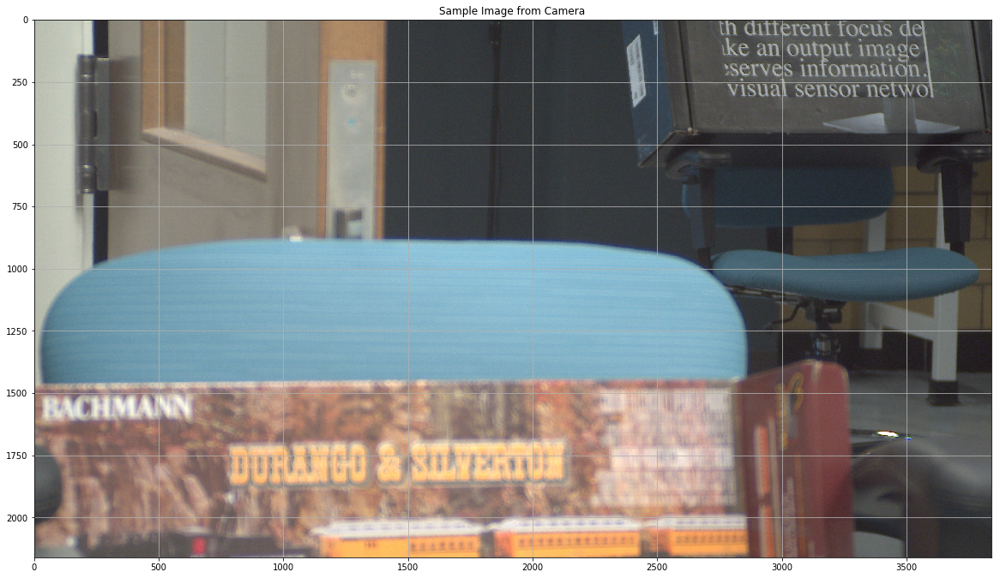

In [5]:
plt.figure(figsize=(20,20))
plt.imshow(tst_img)
plt.grid(True)
plt.title("Sample Image from Camera")

## Identify Regions of Interest (ROIs)

In [6]:
# Pick some regions of interest
clip_size=256

x1= 1600; y1=1000
x2= 0; y2=3000
x3= 600; y3=1100
x4= 1500; y4=300
x5= 1900; y5=2000

Text(0.5,1,'ROI 5')

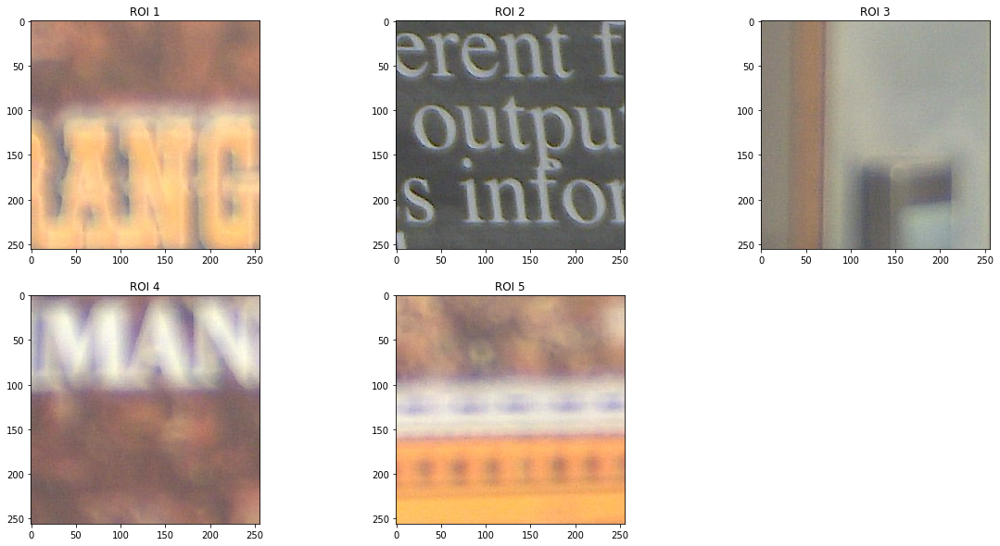

In [7]:
plt.figure(figsize=(20,10))
plt.subplot(2,3,1)
plt.imshow(np.copy(tst_img)[x1:x1+clip_size, y1:y1+clip_size])
plt.title("ROI 1")
plt.subplot(2,3,2)
plt.imshow(np.copy(tst_img)[x2:x2+clip_size, y2:y2+clip_size])
plt.title("ROI 2")
plt.subplot(2,3,3)
plt.imshow(np.copy(tst_img)[x3:x3+clip_size, y3:y3+clip_size])
plt.title("ROI 3")
plt.subplot(2,3,4)
plt.imshow(np.copy(tst_img)[x4:x4+clip_size, y4:y4+clip_size])
plt.title("ROI 4")
plt.subplot(2,3,5)
plt.imshow(np.copy(tst_img)[x5:x5+clip_size, y5:y5+clip_size])
plt.title("ROI 5")

## Auto Focus with DNN

In [8]:
import keras
import keras.callbacks
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Conv2DTranspose, UpSampling2D
from keras.layers import Activation, Dropout, Flatten, Dense
import keras.optimizers as optimizers
from keras import backend as K
if K.backend()=='tensorflow':
    K.set_image_dim_ordering("th")

Using TensorFlow backend.


In [9]:
# Step Estimator Model from "Intelligent Auto Focus" paper
def step_estimator_model():
    model = Sequential()
    # CONV-1
    model.add(Conv2D(filters=4, kernel_size=6, strides=4, activation='relu', input_shape=(3,256,256)))
    # CONV-2
    model.add(Conv2D(filters=8, kernel_size=4, strides=4, activation='relu'))
    # CONV-3
    model.add(Conv2D(filters=8, kernel_size=4, strides=4, activation='relu'))
    # Flatten
    model.add(Flatten())
    # FC-1
    model.add(Dense(64, activation='relu'))
    # FC-2
    model.add(Dense(32, activation='relu'))
    # FC-3
    model.add(Dense(1))

    # Define training functions
    adam = optimizers.Adam(lr=0.0001)
    model.compile(loss='mean_squared_error', optimizer=adam)
    return model

In [10]:
# Initialize model
cnn = step_estimator_model()
cnn.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 4, 63, 63)         436       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 8, 15, 15)         520       
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 8, 3, 3)           1032      
_________________________________________________________________
flatten_1 (Flatten)          (None, 72)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 64)                4672      
_________________________________________________________________
dense_2 (Dense)              (None, 32)                2080      
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 33        
Total para

In [11]:
# load pretrained weights
cnn.load_weights("./HW4_step_estimator_weights_v2.hdf5")

**Set Camera at starting position 1100**

In [12]:
print(resetFocus(sid=0))

ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/resetFocusMotor.py 1"
b"address is 0\nbusnumber is <smbus.SMBus object at 0x7fac3360b0>\nim initializing here\n['1']\nnow my address is 96\nnow my bus is 30\naddress is 96\nbusnumber is <smbus.SMBus object at 0x7fac336170>\nim initializing here\ntrying to reset here\ntrying to build command here\n01010a0400\ndata part of command is [1, 1, 10, 4, 0]\nWidth        = 16\nPoly         = 0x1021\nReflectIn    = False\nXorIn        = 0x0000\nReflectOut   = False\nXorOut       = 0x0000\nAlgorithm    = UNDEFINED\n\ncrc is 216\nI think the full cmd should be [126, 215, 224, 1, 1, 10, 4, 0, 126]\nI2C: Writing list to register 0x60:\n[126, 215, 224, 1, 1, 10, 4, 0, 126]\n"


ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 160"


Text(0.5,1,'Starting Image from Camera Position 1100')

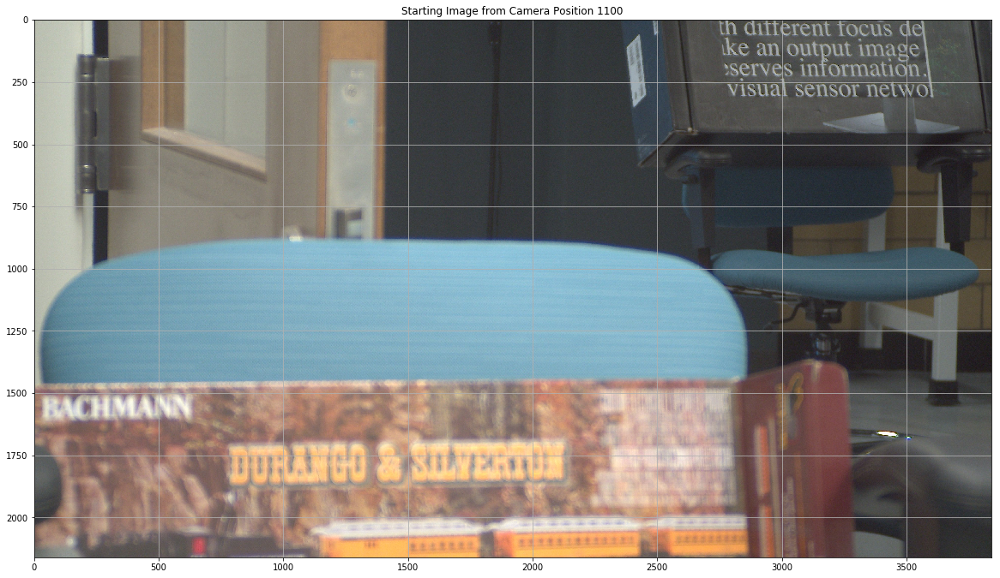

In [13]:
moveFocus(sid=0, step=160)
tst_img = grabImage(imres=8)
plt.figure(figsize=(20,20))
plt.imshow(tst_img)
plt.grid(True)
plt.title("Starting Image from Camera Position 1100")

## Auto Focus Function with DNN

In [14]:
def autofocus_dnn(roix, roiy, num_attempts):
    
    # Set focus position to absolute position = 1100 (as specified in assignment)
    print("Setting initial focus position")
    resetFocus(sid=0)
    time.sleep(3)
    moveFocus(sid=0, step=160)

    roi_hist = []
    position_hist = []
    prediction_hist = []
    
    abs_position = 1100
    clip_size=256
    
    # for the number of allowable attempts
    for a in range(num_attempts):
        
        # Grab the current full frame image at this position
        curr_img = grabImage(imres=8)
        # Isolate the ROI
        curr_roi = np.copy(curr_img)[roix:roix+clip_size, roiy:roiy+clip_size].transpose(2,0,1)/255.
        
        # Get the rounded and bounded prediction
        pred = int(min(max(0,cnn.predict(np.expand_dims(curr_roi,axis=0))[0][0]),300))
        
        print("Attempt: {}/{}, AbsPos: {}, Pred: {}".format(a,num_attempts,abs_position,pred))
        
        # Update stat keepers
        roi_hist.append(np.copy(curr_roi))
        prediction_hist.append(pred)
        position_hist.append(abs_position)
        
        if pred < 20:
            print("Found a good focus point. Done")
            break
        
        # Set initial conditions
        curr_abs_position = abs_position
        step_backward_pred = 1e5
        step_forward_pred = 1e5
        
        # Try to step backwards
        if (abs_position-pred) > 1100:
            # Move backward the predicted steps
            moveFocus(sid=0, step=-pred)
            time.sleep(2)
            curr_abs_position -= pred
            # Grab the full frame at this position
            tmp_img = grabImage(imres=8)
            # Isolate the ROI
            tmp_roi = np.copy(tmp_img)[roix:roix+clip_size, roiy:roiy+clip_size].transpose(2,0,1)/255.
            # Make a prediction at this new location
            step_backward_pred = int(min(max(0,cnn.predict(np.expand_dims(tmp_roi,axis=0))[0][0]),300))
        if (abs_position+pred) < 2000:
            # Move forward the predicted steps
            moveFocus(sid=0, step=(abs_position+pred-curr_abs_position))
            time.sleep(2)
            curr_abs_position = abs_position+pred
            # Grab the full frame at this position
            tmp_img = grabImage(imres=8)
            # Isolate the ROI
            tmp_roi = np.copy(tmp_img)[roix:roix+clip_size, roiy:roiy+clip_size].transpose(2,0,1)/255.
            # Make a prediction at this new location
            step_forward_pred = int(min(max(0,cnn.predict(np.expand_dims(tmp_roi,axis=0))[0][0]),300))
        if step_forward_pred == step_backward_pred:
            print("Both directions are bad, breaking")
            break
        elif step_forward_pred < step_backward_pred:
            print("Taking a step forward")
            abs_position = curr_abs_position
        else:
            print("Taking a step backward")
            if curr_abs_position == (abs_position + pred):
                # Move to correct position
                moveFocus(sid=0, step=-2*pred)
                time.sleep(2)
            elif curr_abs_position == abs_position:
                # Move to correct position
                moveFocus(sid=0, step=-pred)
                time.sleep(2)
            abs_position -= pred
        
    return roi_hist,prediction_hist,position_hist

## Test Auto Focus

### ROI-1

In [15]:
# Region 1
rx1= 1600; ry1=1000

rh,prh,poh = autofocus_dnn(rx1, ry1, 4)

Setting initial focus position
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/resetFocusMotor.py 1"
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 160"
Attempt: 0/4, AbsPos: 1100, Pred: 130
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 130"
Taking a step forward
Attempt: 1/4, AbsPos: 1230, Pred: 77
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 -77"
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 154"
Taking a step backward
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 -154"
Attempt: 2/4, AbsPos: 1153, Pred: 82
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 82"
Taking a step forward
Attempt: 3/4, AbsPos: 1235, Pred: 61
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 -61"
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "pyt

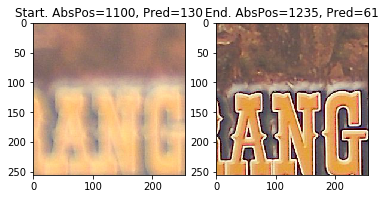

In [16]:
plt.subplot(1,2,1)
plt.imshow(rh[0].transpose(1,2,0))
plt.title("Start. AbsPos={}, Pred={}".format(poh[0],prh[0]))
plt.subplot(1,2,2)
plt.imshow(rh[-1].transpose(1,2,0))
plt.title("End. AbsPos={}, Pred={}".format(poh[-1],prh[-1]))
plt.show()

Text(0.5,1,'ROI-1 Focused Image')

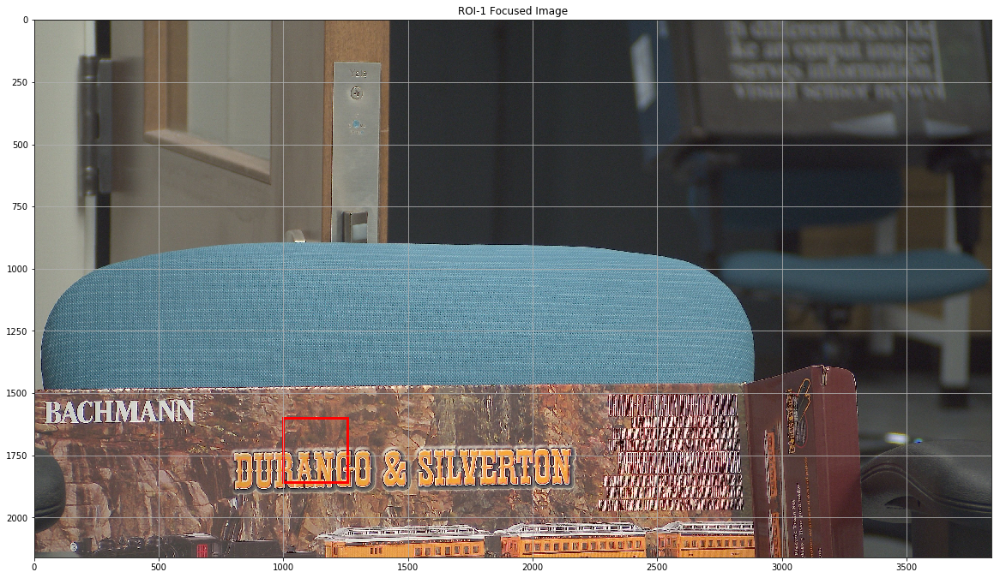

In [17]:
curr_img = grabImage(imres=8)
plt.figure(figsize=(20,20))
plt.imshow(curr_img)
plt.gca().add_patch(plt.Rectangle((ry1, rx1),256,256,fill=False,edgecolor='r', linewidth=3))
plt.grid(True)
plt.title("ROI-1 Focused Image")

### ROI-2

In [18]:
# Region 2
rx2= 0; ry2=3000

rh2,prh2,poh2 = autofocus_dnn(rx2, ry2, 4)

Setting initial focus position
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/resetFocusMotor.py 1"
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 160"
Attempt: 0/4, AbsPos: 1100, Pred: 43
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 43"
Taking a step forward
Attempt: 1/4, AbsPos: 1143, Pred: 32
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 -32"
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 64"
Taking a step backward
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 -64"
Attempt: 2/4, AbsPos: 1111, Pred: 32
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 32"
Taking a step forward
Attempt: 3/4, AbsPos: 1143, Pred: 39
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 -39"
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2

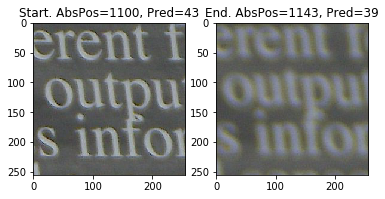

In [19]:
plt.subplot(1,2,1)
plt.imshow(rh2[0].transpose(1,2,0))
plt.title("Start. AbsPos={}, Pred={}".format(poh2[0],prh2[0]))
plt.subplot(1,2,2)
plt.imshow(rh2[-1].transpose(1,2,0))
plt.title("End. AbsPos={}, Pred={}".format(poh2[-1],prh2[-1]))
plt.show()

Text(0.5,1,'ROI-2 Focused Image')

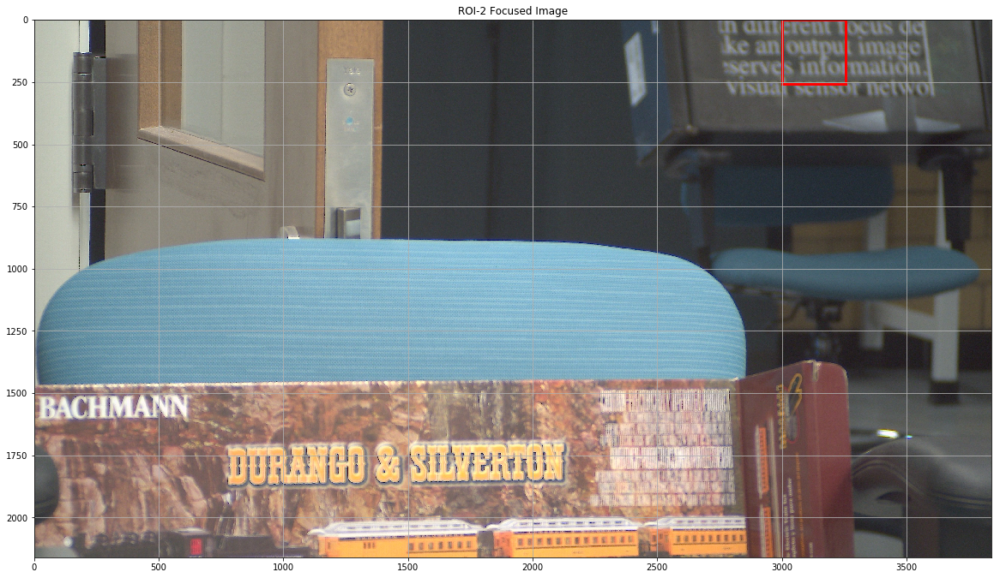

In [20]:
curr_img = grabImage(imres=8)
plt.figure(figsize=(20,20))
plt.imshow(curr_img)
plt.gca().add_patch(plt.Rectangle((ry2, rx2),256,256,fill=False,edgecolor='r', linewidth=3))
plt.grid(True)
plt.title("ROI-2 Focused Image")

### ROI-3

In [21]:
# Region 3
rx3= 600; ry3=1100

rh3,prh3,poh3 = autofocus_dnn(rx3, ry3, 4)

Setting initial focus position
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/resetFocusMotor.py 1"
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 160"
Attempt: 0/4, AbsPos: 1100, Pred: 225
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 225"
Taking a step forward
Attempt: 1/4, AbsPos: 1325, Pred: 123
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 -123"
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 246"
Taking a step forward
Attempt: 2/4, AbsPos: 1448, Pred: 216
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 -216"
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 432"
Taking a step backward
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 -432"
Attempt: 3/4, AbsPos: 1232, Pred: 268
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.3

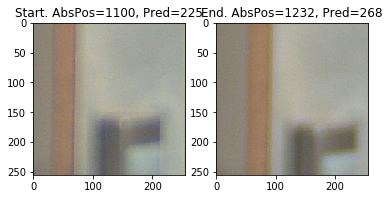

In [22]:
plt.subplot(1,2,1)
plt.imshow(rh3[0].transpose(1,2,0))
plt.title("Start. AbsPos={}, Pred={}".format(poh3[0],prh3[0]))
plt.subplot(1,2,2)
plt.imshow(rh3[-1].transpose(1,2,0))
plt.title("End. AbsPos={}, Pred={}".format(poh3[-1],prh3[-1]))
plt.show()

Text(0.5,1,'ROI-3 Focused Image')

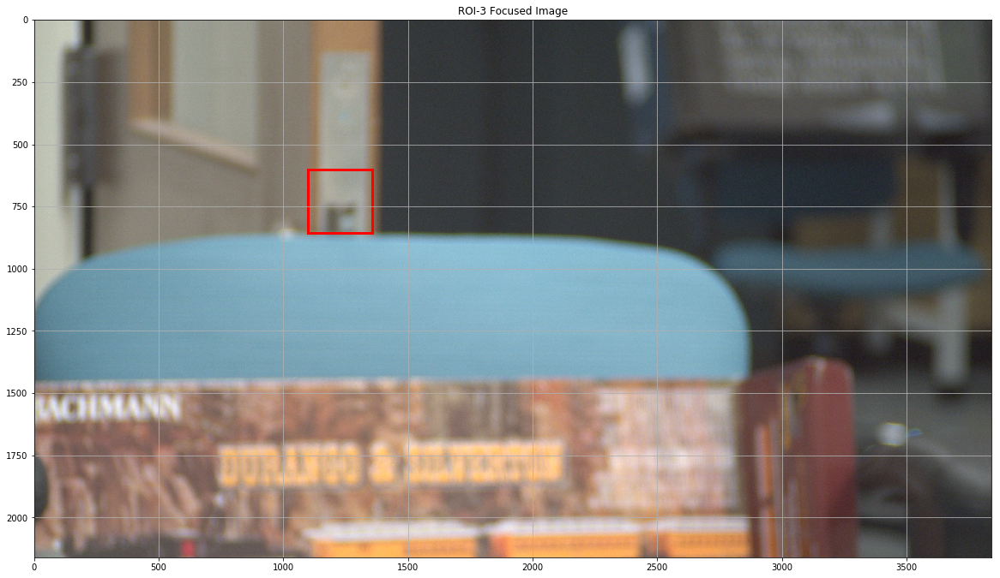

In [23]:
curr_img = grabImage(imres=8)
plt.figure(figsize=(20,20))
plt.imshow(curr_img)
plt.gca().add_patch(plt.Rectangle((ry3, rx3),256,256,fill=False,edgecolor='r', linewidth=3))
plt.grid(True)
plt.title("ROI-3 Focused Image")

### ROI-4

In [24]:
# Region 4
rx4= 1500; ry4=300

rh4,prh4,poh4 = autofocus_dnn(rx4, ry4, 4)

Setting initial focus position
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/resetFocusMotor.py 1"
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 160"
Attempt: 0/4, AbsPos: 1100, Pred: 110
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 110"
Taking a step forward
Attempt: 1/4, AbsPos: 1210, Pred: 80
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 -80"
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 160"
Taking a step forward
Attempt: 2/4, AbsPos: 1290, Pred: 43
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 -43"
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 86"
Both directions are bad, breaking


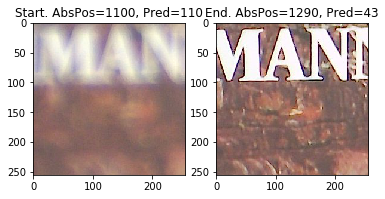

In [25]:
plt.subplot(1,2,1)
plt.imshow(rh4[0].transpose(1,2,0))
plt.title("Start. AbsPos={}, Pred={}".format(poh4[0],prh4[0]))
plt.subplot(1,2,2)
plt.imshow(rh4[-1].transpose(1,2,0))
plt.title("End. AbsPos={}, Pred={}".format(poh4[-1],prh4[-1]))
plt.show()

Text(0.5,1,'ROI-4 Focused Image')

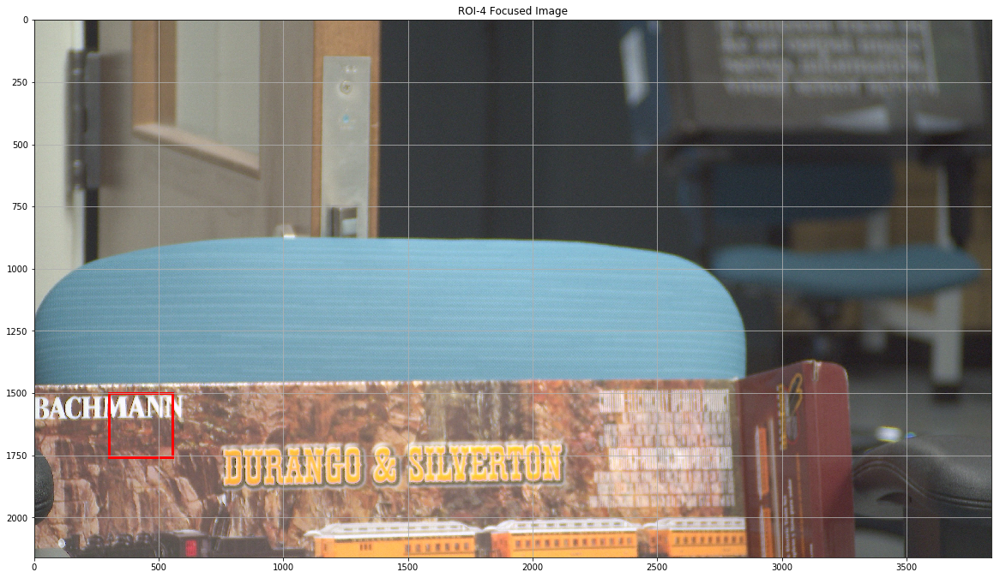

In [26]:
curr_img = grabImage(imres=8)
plt.figure(figsize=(20,20))
plt.imshow(curr_img)
plt.gca().add_patch(plt.Rectangle((ry4, rx4),256,256,fill=False,edgecolor='r', linewidth=3))
plt.grid(True)
plt.title("ROI-4 Focused Image")

### ROI-5

In [27]:
# Region 5
rx5= 1900; ry5=2000

rh5,prh5,poh5 = autofocus_dnn(rx5, ry5, 4)

Setting initial focus position
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/resetFocusMotor.py 1"
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 160"
Attempt: 0/4, AbsPos: 1100, Pred: 165
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 165"
Taking a step forward
Attempt: 1/4, AbsPos: 1265, Pred: 29
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 -29"
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 58"
Taking a step backward
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 -58"
Attempt: 2/4, AbsPos: 1236, Pred: 61
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 -61"
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 122"
Taking a step backward
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 -122"


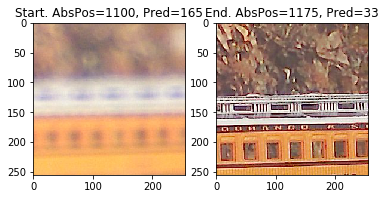

In [28]:
plt.subplot(1,2,1)
plt.imshow(rh5[0].transpose(1,2,0))
plt.title("Start. AbsPos={}, Pred={}".format(poh5[0],prh5[0]))
plt.subplot(1,2,2)
plt.imshow(rh5[-1].transpose(1,2,0))
plt.title("End. AbsPos={}, Pred={}".format(poh5[-1],prh5[-1]))
plt.show()

Text(0.5,1,'ROI-5 Focused Image')

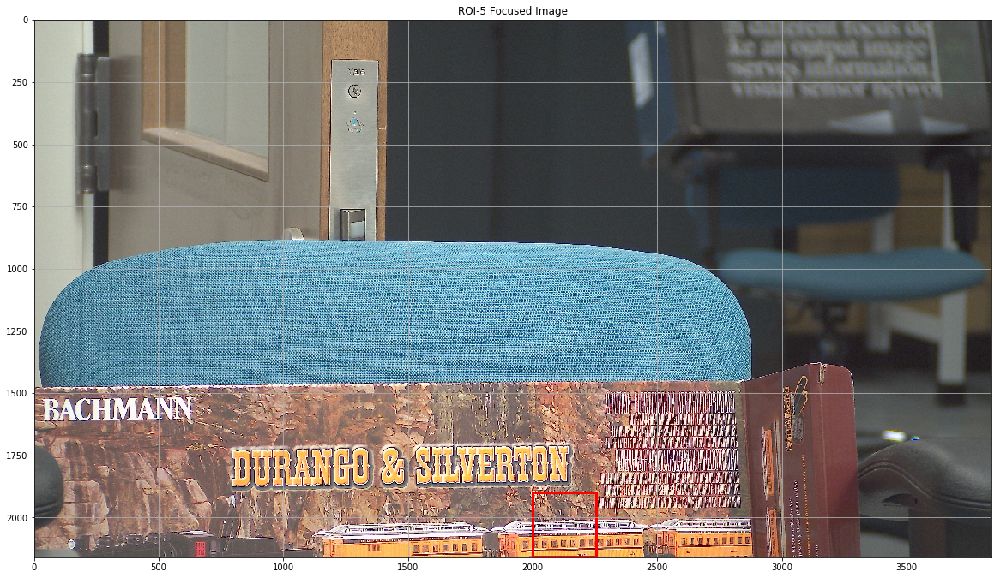

In [29]:
curr_img = grabImage(imres=8)
plt.figure(figsize=(20,20))
plt.imshow(curr_img)
plt.gca().add_patch(plt.Rectangle((ry5, rx5),256,256,fill=False,edgecolor='r', linewidth=3))
plt.grid(True)
plt.title("ROI-5 Focused Image")

## Conclusions